# Set up

In [ ]:
def setup_kaggle():
  from google.colab import files
  uploaded = files.upload()
  !chmod 600 kaggle.json
  %mkdir -p /root/.kaggle/
  %mv kaggle.json /root/.kaggle/

setup_kaggle()


Saving kaggle.json to kaggle.json


In [ ]:
!pip install -q matplotlib==3.7.3

In [ ]:
!pip install -q kaggle recmetrics

import kaggle
kaggle.api.authenticate()

import recmetrics

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

# Just aesthetic to not show irrelevant warnings
import warnings; warnings.filterwarnings("ignore")

In [ ]:
dataset_path = 'dbdmobile/myanimelist-dataset'
download_path = 'myanimelist-dataset'

kaggle.api.dataset_download_files(dataset_path, path=download_path, unzip=True)

# Step 5: List the files
!ls $download_path

Dataset URL: https://www.kaggle.com/datasets/dbdmobile/myanimelist-dataset
anime-dataset-2023.csv	final_animedataset.csv	users-details-2023.csv
anime-filtered.csv	user-filtered.csv	users-score-2023.csv


# Data Exploration

In [ ]:
import pandas as pd

pd.set_option('display.max_columns', None)

final_df = pd.read_csv("myanimelist-dataset/final_animedataset.csv")
anime_df = pd.read_csv("myanimelist-dataset/anime-dataset-2023.csv")
users_score_df = pd.read_csv("myanimelist-dataset/users-score-2023.csv")
user_filtered_df = pd.read_csv("myanimelist-dataset/user-filtered.csv")

def summarize_dataset(df, name):
    print(f"\n===== {name} =====")
    print("Shape (rows, columns):", df.shape)
    print("\n--- Info ---")
    df_info = df.info()  # prints info directly, returns None
    print("\n--- Head (first 5 rows) ---")
    print(df.head())
    print("\n--- Describe (numeric and object columns) ---")
    print(df.describe(include='all'))

summarize_dataset(final_df, "final_animedataset.csv")
summarize_dataset(anime_df, "anime-dataset-2023.csv")
summarize_dataset(users_score_df, "users-score-2023.csv")
summarize_dataset(user_filtered_df, "user-filtered")



===== final_animedataset.csv =====
Shape (rows, columns): (35305695, 13)

--- Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35305695 entries, 0 to 35305694
Data columns (total 13 columns):
 #   Column      Dtype  
---  ------      -----  
 0   username    object 
 1   anime_id    int64  
 2   my_score    int64  
 3   user_id     int64  
 4   gender      object 
 5   title       object 
 6   type        object 
 7   source      object 
 8   score       float64
 9   scored_by   int64  
 10  rank        float64
 11  popularity  int64  
 12  genre       object 
dtypes: float64(2), int64(5), object(6)
memory usage: 3.4+ GB

--- Head (first 5 rows) ---
   username  anime_id  my_score  user_id  gender          title type source  \
0  karthiga        21         9  2255153  Female      One Piece   TV  Manga   
1  karthiga        59         7  2255153  Female        Chobits   TV  Manga   
2  karthiga        74         7  2255153  Female   Gakuen Alice   TV  Manga   
3  karthiga    

## Data Cleaning

In [ ]:
import numpy as np

# 2. Check for Missing Values and Duplicates
print("Missing values in final_df:")
print(final_df.isnull().sum())
print("Duplicates in final_df:", final_df.duplicated().sum())

print("\nMissing values in anime_df:")
print(anime_df.isnull().sum())
print("Duplicates in anime_df:", anime_df.duplicated().sum())

print("\nMissing values in users_score_df:")
print(users_score_df.isnull().sum())
print("Duplicates in users_score_df:", users_score_df.duplicated().sum())

print("\nMissing values in user_filtered_df:")
print(user_filtered_df.isnull().sum())
print("Duplicates in user_filtered_df:", user_filtered_df.duplicated().sum())

# Drop duplicates
final_df.drop_duplicates(inplace=True)
anime_df.drop_duplicates(inplace=True)
users_score_df.drop_duplicates(inplace=True)
user_filtered_df.drop_duplicates(inplace=True)


# For anime_df: Convert 'Genres' from string to list of genres.
anime_df['Genres'] = anime_df['Genres'].apply(
    lambda x: [genre.strip() for genre in x.split(',')] if isinstance(x, str) else []
)

# Convert 'Score' to numeric (some entries might be non-numeric strings)
anime_df['Score'] = pd.to_numeric(anime_df['Score'], errors='coerce')

# Convert 'Episodes' to numeric, handling any non-numeric issues (e.g., "Unknown" or "N/A")
anime_df['Episodes'] = pd.to_numeric(anime_df['Episodes'], errors='coerce')

# (Optional) Standardize text fields: For example, lowercase the 'type' and 'source' columns in final_df.
final_df['type'] = final_df['type'].str.lower().str.strip()
final_df['source'] = final_df['source'].str.lower().str.strip()

# Merge Datasets
merged_df = pd.merge(final_df, anime_df, on="anime_id", how="left")
print("\nMerged dataset shape:", merged_df.shape)
print(merged_df.head())



Missing values in final_df:
username         256
anime_id           0
my_score           0
user_id            0
gender             0
title              0
type               0
source             0
score              0
scored_by          0
rank          751970
popularity         0
genre           2267
dtype: int64
Duplicates in final_df: 0

Missing values in anime_df:
anime_id        0
Name            0
English name    0
Other name      0
Score           0
Genres          0
Synopsis        0
Type            0
Episodes        0
Aired           0
Premiered       0
Status          0
Producers       0
Licensors       0
Studios         0
Source          0
Duration        0
Rating          0
Rank            0
Popularity      0
Favorites       0
Scored By       0
Members         0
Image URL       0
dtype: int64
Duplicates in anime_df: 0

Missing values in users_score_df:
user_id        0
Username       0
anime_id       0
Anime Title    0
rating         0
dtype: int64
Duplicates in users_score_d

In [ ]:
# Sample 2 million rows from the already loaded final_df
sample_size = 2_000_000
total_rows = final_df.shape[0]
fraction = sample_size / total_rows

# Take a random sample
final_df = final_df.sample(frac=fraction, random_state=42)

print("Sampled final_df shape:", final_df.shape)
print(final_df.info(memory_usage='deep'))

Sampled final_df shape: (2000000, 13)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000000 entries, 1444015 to 11726079
Data columns (total 13 columns):
 #   Column      Dtype  
---  ------      -----  
 0   username    object 
 1   anime_id    int64  
 2   my_score    int64  
 3   user_id     int64  
 4   gender      object 
 5   title       object 
 6   type        object 
 7   source      object 
 8   score       float64
 9   scored_by   int64  
 10  rank        float64
 11  popularity  int64  
 12  genre       object 
dtypes: float64(2), int64(5), object(6)
memory usage: 940.4 MB
None


# Exploratory analysis

### Distribution of User Ratings

In [ ]:
import plotly.express as px
import pandas as pd

# Assuming final_df is already defined and loaded.
fig = px.histogram(
    final_df,
    x="my_score",
    nbins=10,  # Adjust the number of bins as needed.
    title="Distribution of User Ratings (my_score)",
    labels={"my_score": "User Rating"}
)

fig.show()


### Gender Distribution

In [ ]:
import plotly.express as px
import pandas as pd

# Compute gender counts and convert to a DataFrame.
gender_counts = final_df["gender"].value_counts().reset_index()
gender_counts.columns = ["Gender", "Count"]

fig = px.bar(
    gender_counts,
    x="Gender",
    y="Count",
    title="Gender Distribution in Sample",
    color="Gender",
    color_discrete_sequence=px.colors.diverging.RdBu  # Use a valid diverging palette.
)

fig.show()


### Top 10 Popular Anime

In [ ]:
import plotly.express as px

# Get top 10 popular anime (lowest popularity number indicates highest popularity)
top_popular = (final_df
               .groupby(["anime_id", "title"])["popularity"]
               .min()
               .reset_index()
               .sort_values("popularity", ascending=True)
               .head(10))

# Plot the top 10 anime
fig = px.bar(top_popular,
             x='popularity',
             y='title',
             orientation='h',
             color='popularity',
             color_continuous_scale='Viridis_r',
             title="Top 10 Most Popular Anime (Lower number indicates higher popularity)",
             labels={"popularity": "Popularity (Rank)", "title": "Anime Title"})

fig.update_layout(yaxis={'categoryorder':'total ascending'},
                  template='plotly_white')

fig.show()


### Merge DataFrames

In [ ]:
# Merge on anime_id
merged_df = pd.merge(final_df, anime_df, left_on="anime_id", right_on="anime_id", how="left")

print("Merged DataFrame shape:", merged_df.shape)
print(merged_df.columns)


Merged DataFrame shape: (2000000, 36)
Index(['username', 'anime_id', 'my_score', 'user_id', 'gender', 'title',
       'type', 'source', 'score', 'scored_by', 'rank', 'popularity', 'genre',
       'Name', 'English name', 'Other name', 'Score', 'Genres', 'Synopsis',
       'Type', 'Episodes', 'Aired', 'Premiered', 'Status', 'Producers',
       'Licensors', 'Studios', 'Source', 'Duration', 'Rating', 'Rank',
       'Popularity', 'Favorites', 'Scored By', 'Members', 'Image URL'],
      dtype='object')


### Distribution of ratings per user log scale

In [ ]:
import pandas as pd
import plotly.express as px

# Group the data and reset index for Plotly compatibility
user_counts = final_df.groupby("user_id")["anime_id"].count().reset_index(name="rating_count")

# Plot interactive histogram with a log-scaled y-axis
fig = px.histogram(user_counts, x="rating_count", nbins=50, log_y=True,
                   title="Distribution of Ratings per User (log scale)",
                   labels={"rating_count": "Number of Ratings per User"})
fig.show()


### User ratings vs Ofiicial anime Score

In [ ]:
# Sample a subset for interactive plotting
sample_scatter = final_df.sample(100000, random_state=42)

fig = px.scatter(sample_scatter, x="score", y="my_score", opacity=0.3,
                 title="User Rating (my_score) vs. Official Anime Score",
                 labels={"score": "Official Anime Score", "my_score": "User Rating (my_score)"},
                 hover_data=["title"])
fig.show()


### Top 15 Genres

In [ ]:
# Process genre column to split comma-separated values
genre_series = final_df["genre"].dropna().apply(lambda x: [g.strip() for g in x.split(",")])
all_genres = [g for sublist in genre_series for g in sublist if g]
genre_counts = pd.Series(all_genres).value_counts().reset_index()
genre_counts.columns = ["genre", "count"]

fig = px.bar(genre_counts.head(15), x="count", y="genre", orientation="h",
             title="Top 15 Genres in the Sampled Data",
             labels={"count": "Count", "genre": "Genre"})
fig.update_yaxes(autorange="reversed")  # Reverse the order for better readability
fig.show()


In [ ]:
import altair as alt

# Select numeric columns for correlation analysis
numeric_cols = ["my_score", "score", "scored_by", "rank", "popularity"]
corr_matrix = final_df[numeric_cols].corr().reset_index().melt('index')
corr_matrix.columns = ['Variable 1', 'Variable 2', 'Correlation']

# Build the heatmap using Altair
heatmap = alt.Chart(corr_matrix).mark_rect().encode(
    x=alt.X('Variable 1:N', title='Variable'),
    y=alt.Y('Variable 2:N', title='Variable'),
    color=alt.Color('Correlation:Q', scale=alt.Scale(scheme='inferno'), title="Correlation"),
    tooltip=['Variable 1', 'Variable 2', 'Correlation']
).properties(
    title='Correlation Matrix of Key Numeric Features',
    width=300,
    height=300
)

heatmap.display()


alt.Chart(...)

# Efficient Data Loading and Preprocessing for Anime Recommendation with PyTorch

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Ensure critical columns have no missing values
final_df.dropna(subset=["user_id", "anime_id", "my_score"], inplace=True)
print("Data shape after dropna:", final_df.shape)

# Get unique users and animes
unique_users = final_df["user_id"].unique()
unique_animes = final_df["anime_id"].unique()

# Map user/anime IDs to indices
user_to_idx = {user_id: idx for idx, user_id in enumerate(unique_users)}
anime_to_idx = {anime_id: idx for idx, anime_id in enumerate(unique_animes)}

# Add index columns to dataframe
final_df["user_idx"] = final_df["user_id"].map(user_to_idx)
final_df["anime_idx"] = final_df["anime_id"].map(anime_to_idx)

# Convert to PyTorch tensors
user_tensor = torch.tensor(final_df["user_idx"].values, dtype=torch.long)
anime_tensor = torch.tensor(final_df["anime_idx"].values, dtype=torch.long)
rating_tensor = torch.tensor(final_df["my_score"].values, dtype=torch.float)


Using device: cuda
Data shape after dropna: (2000000, 13)


In [ ]:
class AnimeRatingsDataset(Dataset):
    def __init__(self, users, animes, ratings):
        self.users = users
        self.animes = animes
        self.ratings = ratings

    def __len__(self):
        return len(self.ratings)

    def __getitem__(self, idx):
        return (
            self.users[idx],
            self.animes[idx],
            self.ratings[idx]
        )

# Instantiate the dataset
dataset = AnimeRatingsDataset(user_tensor, anime_tensor, rating_tensor)

# Create a DataLoader
# pin_memory=True can help with GPU transfers on large data
loader = DataLoader(dataset, batch_size=1024, shuffle=True, pin_memory=True)


In [ ]:
import pandas as pd
from pandas.core.internals.managers import BlockManager
import torch

torch.serialization.add_safe_globals([pd.DataFrame, BlockManager])


# Random recommender

In [ ]:
class RandomRecommender:
    def __init__(self, anime_df):
        # Reset index for continuous indexing.
        self.anime_df = anime_df.reset_index(drop=True)
        self.anime_ids = self.anime_df['anime_id'].tolist()
        self.num_anime = len(self.anime_ids)

    def recommend(self, n=10):
        # Generate n random indices using NumPy.
        import numpy as np
        random_indices = np.random.randint(low=0, high=self.num_anime, size=n).tolist()
        return self.anime_df.iloc[random_indices]

    def save(self, path):
        # Save the entire DataFrame using pandas to_pickle.
        self.anime_df.to_pickle(path + "_random.pkl")

    def load(self, path):
        # Load the DataFrame using pandas read_pickle.
        self.anime_df = pd.read_pickle(path + "_random.pkl")

## Popular recommender

In [ ]:
class PopularRecommender:
    def __init__(self, anime_df):
        self.anime_df = anime_df.copy()
        # Ensure 'Score' is numeric; drop rows where conversion fails.
        self.anime_df['Score'] = pd.to_numeric(self.anime_df['Score'], errors='coerce')
        self.anime_df.dropna(subset=['Score'], inplace=True)
        # Sort by 'Score' in descending order (highest rated first).
        self.popular_df = self.anime_df.sort_values(by='Score', ascending=False).reset_index(drop=True)

    def recommend(self, n=10):
        # Return top n popular anime.
        return self.popular_df.head(n)

    def save(self, path):
        # Save the sorted DataFrame using pandas to_pickle.
        self.popular_df.to_pickle(path + "_popular.pkl")

    def load(self, path):
        self.popular_df = pd.read_pickle(path + "_popular.pkl")

## Demographic recommender


In [ ]:
class DemographicRecommender:
    def __init__(self, final_df, anime_df):
        """
        Assumes final_df has columns: 'gender', 'anime_id', 'my_score'
        and anime_df contains metadata (including 'anime_id') for additional details.
        """
        self.final_df = final_df.copy()
        self.anime_df = anime_df.copy()
        # Compute average user rating for each anime per gender.
        self.demographic_scores = (
            self.final_df.groupby(['gender', 'anime_id'])['my_score']
            .mean()
            .reset_index()
        )
        # Merge with anime metadata to include details (e.g., title).
        self.demographic_df = pd.merge(self.demographic_scores, self.anime_df, on="anime_id", how="left")
        # Pre-sort recommendations for each gender.
        self.recommendations_by_gender = {}
        for gender in self.demographic_df['gender'].unique():
            df_gender = self.demographic_df[self.demographic_df['gender'] == gender].copy()
            df_gender = df_gender.sort_values(by='my_score', ascending=False).reset_index(drop=True)
            self.recommendations_by_gender[gender] = df_gender

    def recommend(self, gender, n=10):
        if gender not in self.recommendations_by_gender:
            raise ValueError(f"Gender {gender} not found in the data.")
        return self.recommendations_by_gender[gender].head(n)

    def save(self, path):
        # Save the dictionary of recommendations by gender using pickle.
        with open(path + "_demographic.pkl", "wb") as f:
            pickle.dump(self.recommendations_by_gender, f)

    def load(self, path):
        with open(path + "_demographic.pkl", "rb") as f:
            self.recommendations_by_gender = pickle.load(f)

# Testing the Recommenders

In [ ]:
random_rec = RandomRecommender(anime_df)
popular_rec = PopularRecommender(anime_df)
demographic_rec = DemographicRecommender(final_df, anime_df)

# Test Random Recommender.
print("=== Testing Random Recommender ===")
print(random_rec.recommend(n=5))

# Test Popular Recommender.
print("\n=== Testing Popular Recommender ===")
print(popular_rec.recommend(n=5))

# Test Demographic Recommender for 'Female'.
print("\n=== Testing Demographic Recommender for 'Female' ===")
print(demographic_rec.recommend(gender="Female", n=5))

# --- Testing Saving and Loading Functionality.

# Ensure the "model" directory exists.
if not os.path.exists("model"):
    os.makedirs("model")

# Save each recommender.
random_rec.save("model/random_recommender")
popular_rec.save("model/popular_recommender")
demographic_rec.save("model/demographic_recommender")

# Create new instances and load the saved models to test.
random_rec_loaded = RandomRecommender(anime_df)
random_rec_loaded.load("model/random_recommender")

popular_rec_loaded = PopularRecommender(anime_df)
popular_rec_loaded.load("model/popular_recommender")

demographic_rec_loaded = DemographicRecommender(final_df, anime_df)
demographic_rec_loaded.load("model/demographic_recommender")

print("\n=== Testing Random Recommender (Loaded) ===")
print(random_rec_loaded.recommend(n=5))

print("\n=== Testing Popular Recommender (Loaded) ===")
print(popular_rec_loaded.recommend(n=5))

print("\n=== Testing Demographic Recommender for 'Female' (Loaded) ===")
print(demographic_rec_loaded.recommend(gender="Female", n=5))

=== Testing Random Recommender ===
       anime_id                     Name                        English name  \
12432     34591  Natsume Yuujinchou Roku  Natsume's Book of Friends Season 6   
5844       9673  Tegamibachi: Omakebachi         Letter Bee Reverse Specials   
2312       2525             Kekkou Kamen                             UNKNOWN   
22341     51526         Mogu Mogu Yummy!                             UNKNOWN   
10997     31652         Taimanin Asagi 2                             UNKNOWN   

       Other name  Score                                Genres  \
12432     夏目友人帳 陸   8.62  [Drama, Slice of Life, Supernatural]   
5844       裏テガミバチ   6.81                              [Comedy]   
2312       けっこう仮面   5.58                       [Comedy, Ecchi]   
22341  もぐもぐYUMMY！   6.43                             [Gourmet]   
10997     対魔忍アサギ2   6.31                [Supernatural, Hentai]   

                                                Synopsis     Type  Episodes  \
12432  T

### Result Explanation

The random recommender simply returns a diverse selection of anime from the entire dataset without any personalization, so its suggestions vary widely in theme and quality. In contrast, the popular recommender consistently suggests titles that have received the highest ratings overall, such as well-known and critically acclaimed series, reflecting the collective preference of the user base. Meanwhile, the demographic recommender for 'Female' filters the recommendations based on the preferences of female users, yielding titles that this group rates highly. Overall, while the random method offers variety, the popular and demographic recommenders provide more targeted and potentially relevant suggestions based on global and group-specific preferences, respectively.

## Evaluation for non-personalized Recommenders

### Train-test split per user


In [ ]:
import random
import time

def train_test_split_per_user(df, test_size=1):
    """
    Splits the dataframe into train and test sets.
    For each user with more than test_size interactions, randomly hold out 'test_size' rows for testing.
    Returns:
      train_df: DataFrame of training interactions.
      test_df: DataFrame of test interactions.
    """
    train_list = []
    test_list = []
    # Group by user_id
    for user, group in df.groupby('user_id'):
        if len(group) > test_size:
            # Randomly sample test_size interactions for test set
            test_indices = group.sample(n=test_size, random_state=42).index
            test_group = group.loc[test_indices]
            train_group = group.drop(test_indices)
            train_list.append(train_group)
            test_list.append(test_group)
        else:
            # If a user has only one or few interactions, keep them all in train set
            train_list.append(group)
    train_df = pd.concat(train_list).reset_index(drop=True)
    test_df = pd.concat(test_list).reset_index(drop=True) if test_list else pd.DataFrame(columns=df.columns)
    return train_df, test_df

# For benchmarking, use a subset of the full dataset (e.g., our sampled final_df)
train_df, test_df = train_test_split_per_user(final_df, test_size=1)
print(f"Train set: {train_df.shape[0]} interactions, Test set: {test_df.shape[0]} interactions")

Train set: 1898653 interactions, Test set: 101347 interactions


### Define Precision@K Metric

In [ ]:
def precision_at_k(recommender, test_df, k=10, recommender_type="nonpersonalized"):
    """
    Computes the average precision@k for a recommender.
    For each user in the test_df, we check if the held-out test item is in the top-k recommendations.
    For demographic recommender, it uses the gender from the test set.
    """
    user_precisions = []

    # Get unique users in test set
    test_users = test_df['user_id'].unique()

    for user in test_users:
        # Test items for the user (should be 1 item per our split)
        user_test_items = set(test_df[test_df['user_id'] == user]['anime_id'])

        if recommender_type == "demographic":
            # For demographic recommender, determine user's gender from the test set (assumes it's available)
            user_gender = test_df[test_df['user_id'] == user]['gender'].iloc[0]
            # Get recommendations for that gender
            recs = recommender.recommend(gender=user_gender, n=k)
        else:
            recs = recommender.recommend(n=k)

        # Convert recommendations to a set of anime_ids
        rec_items = set(recs['anime_id'].tolist())

        # Since our test set has one item per user, precision@k is 1 if the item is in recommendations, else 0
        hit = 1 if len(user_test_items.intersection(rec_items)) > 0 else 0
        user_precisions.append(hit)

    # Average precision across users (this is equivalent to hit rate)
    avg_precision = np.mean(user_precisions)
    return avg_precision

### Evaluate Each Recommender

In [ ]:
# Evaluate Random Recommender
random_precision = precision_at_k(random_rec, test_df, k=10, recommender_type="nonpersonalized")
print(f"Random Recommender Precision@10: {random_precision:.2f}")

# Evaluate Popular Recommender
popular_precision = precision_at_k(popular_rec, test_df, k=10, recommender_type="nonpersonalized")
print(f"Popular Recommender Precision@10: {popular_precision:.2f}")

# Evaluate Demographic Recommender (for users with gender information)
demographic_precision = precision_at_k(demographic_rec, test_df, k=10, recommender_type="demographic")
print(f"Demographic Recommender Precision@10: {demographic_precision:.2f}")

Random Recommender Precision@10: 0.00
Popular Recommender Precision@10: 0.01
Demographic Recommender Precision@10: 0.01


### Results Interpretation

The evaluation results indicate that all non-personalized recommenders perform poorly, with Precision@10 scores of 0.00 for the Random Recommender and 0.01 for both the Popular and Demographic Recommenders. This demonstrates their inability to accurately predict user preferences and highlights the need for more sophisticated, personalized models.

# Memory Based Collaborative Filtering

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def create_user_item_matrix(df):
    """
    Create a pivot table where rows are user_ids and columns are anime_ids.
    Missing ratings are filled with 0.
    """
    user_item = df.pivot_table(index="user_id", columns="anime_id", values="my_score", fill_value=0)
    return user_item

def compute_item_similarity(user_item_matrix):
    """
    Computes cosine similarity between items.
    Returns a DataFrame where both index and columns are anime_ids.
    """
    item_matrix = user_item_matrix.T
    similarity = cosine_similarity(item_matrix)
    similarity_df = pd.DataFrame(similarity, index=item_matrix.index, columns=item_matrix.index)
    return similarity_df

def predict_ratings_item_based(user_id, user_item_matrix, similarity_df, k=10):
    """
    For a given user, predict ratings for all items the user hasn't rated.
    Then, return the top-k items with the highest predicted rating.
    """
    user_ratings = user_item_matrix.loc[user_id]
    rated_items = user_ratings[user_ratings > 0].index
    predictions = {}

    for item in user_item_matrix.columns:
        if user_ratings[item] == 0:
            # similarity between this item and items the user rated
            sim_scores = similarity_df.loc[item, rated_items]
            ratings = user_ratings[rated_items]
            if sim_scores.sum() > 0:
                predicted_rating = np.dot(sim_scores, ratings) / sim_scores.sum()
            else:
                predicted_rating = 0
            predictions[item] = predicted_rating

    # Return the top-k items sorted by predicted rating
    top_items = sorted(predictions.items(), key=lambda x: x[1], reverse=True)[:k]
    return top_items

user_item_matrix = create_user_item_matrix(train_df)
# Compute item similarity
item_similarity = compute_item_similarity(user_item_matrix)

# Example
example_user = user_item_matrix.index[0]
memory_based_recs = predict_ratings_item_based(example_user, user_item_matrix, item_similarity, k=10)
print("Memory-based CF recommendations for user", example_user, ":", memory_based_recs)


Memory-based CF recommendations for user 1 : [(31810, 10.000000000000002), (33245, 10.000000000000002), (217, 10.0), (616, 10.0), (754, 10.0), (913, 10.0), (1038, 10.0), (1200, 10.0), (1208, 10.0), (1394, 10.0)]


# Model Based


### Remap user and Anime IDS

In [ ]:
unique_users = train_df['user_id'].unique()
user_to_index = {user: idx for idx, user in enumerate(unique_users)}
unique_items = train_df['anime_id'].unique()
item_to_index = {item: idx for idx, item in enumerate(unique_items)}

train_df = train_df.copy()  # work on a copy
train_df['user_idx'] = train_df['user_id'].map(user_to_index)
train_df['item_idx'] = train_df['anime_id'].map(item_to_index)

# Build a user-item matrix later with the remapped indices if needed.
def create_user_item_matrix(df):
    # Pivot table with user_idx as rows and item_idx as columns.
    user_item = df.pivot_table(index="user_idx", columns="item_idx", values="my_score", fill_value=0)
    return user_item

user_item_matrix = create_user_item_matrix(train_df)

# Define an example user using the remapped index.
example_user = user_item_matrix.index[0]

### Define PyTorch Dataset using Remapped IDs

In [ ]:
class RatingsDataset(Dataset):
    def __init__(self, df):
        # Use remapped indices.
        self.users = torch.tensor(df['user_idx'].values, dtype=torch.long)
        self.items = torch.tensor(df['item_idx'].values, dtype=torch.long)
        self.ratings = torch.tensor(df['my_score'].values, dtype=torch.float)
    def __len__(self):
        return len(self.ratings)
    def __getitem__(self, idx):
        return self.users[idx], self.items[idx], self.ratings[idx]

ratings_dataset = RatingsDataset(train_df)
dataloader = DataLoader(ratings_dataset, batch_size=1024, shuffle=True)

### Define Matrix Factorization Model

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Define the matrix factorization model.
class MFModel(nn.Module):
    def __init__(self, num_users, num_items, embedding_dim=32):
        super(MFModel, self).__init__()
        self.user_embedding = nn.Embedding(num_users, embedding_dim)
        self.item_embedding = nn.Embedding(num_items, embedding_dim)
    def forward(self, user, item):
        user_vec = self.user_embedding(user)
        item_vec = self.item_embedding(item)
        # Predict rating as the dot product of user and item embeddings.
        rating = (user_vec * item_vec).sum(dim=1)
        return rating

# Assume unique_users and unique_items are defined:
num_users = len(unique_users)
num_items = len(unique_items)

model = MFModel(num_users, num_items, embedding_dim=32).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
criterion = nn.MSELoss()


Using device: cuda


### Model training

In [ ]:
epochs = 5
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for user, item, rating in dataloader:
        user, item, rating = user.to(device), item.to(device), rating.to(device)
        optimizer.zero_grad()
        pred = model(user, item)
        loss = criterion(pred, rating)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    avg_loss = total_loss / len(dataloader)
    print(f"Epoch {epoch+1}/{epochs}, Loss: {avg_loss:.4f}")

Epoch 1/5, Loss: 47.2064
Epoch 2/5, Loss: 14.9196
Epoch 3/5, Loss: 9.6229
Epoch 4/5, Loss: 7.9062
Epoch 5/5, Loss: 6.5160


### Define Recommendation Function for Model-Based CF

In [ ]:
def recommend_model_based(model, user_id, user_item_matrix, k=10):
    """
    Given a trained model, recommend top k items for a given user_id (using remapped user_idx)
    that the user hasn't rated.
    """
    model.eval()
    # Get items that the user has already rated using the remapped index.
    rated_items = set(user_item_matrix.loc[user_id][user_item_matrix.loc[user_id] > 0].index)
    candidate_items = list(set(user_item_matrix.columns) - rated_items)
    if not candidate_items:
        return []

    # Create tensors for candidate items.
    user_tensor = torch.tensor([user_id] * len(candidate_items), dtype=torch.long).to(device)
    items_tensor = torch.tensor(candidate_items, dtype=torch.long).to(device)

    with torch.no_grad():
        preds = model(user_tensor, items_tensor).cpu().numpy()

    # Zip candidate items with predicted ratings and sort.
    recs = sorted(list(zip(candidate_items, preds)), key=lambda x: x[1], reverse=True)[:k]
    return recs

### Generate Recommendations for an Example User

In [ ]:
model_based_recs = recommend_model_based(model, example_user, user_item_matrix, k=10)
print("Model-based CF recommendations for user", example_user, ":", model_based_recs)

Model-based CF recommendations for user 0 : [(8174, 18.854866), (7240, 18.203299), (8480, 18.000519), (2086, 17.579218), (7306, 16.909874), (5578, 16.763596), (7832, 16.743296), (7208, 16.674), (7961, 16.336744), (8343, 16.086967)]


# Evaluation

### Subsamples for faster testing

In [ ]:
train_sample_size = 10000  # e.g., 10,000 rows for training
test_sample_size = 2000   # e.g., 2,000 rows for testing

sub_train_df = train_df.sample(n=train_sample_size, random_state=42).copy()
sub_test_df = test_df.sample(n=test_sample_size, random_state=42).copy()

### REMAP USER AND ITEM IDS on Subsamples

In [ ]:
unique_users = sub_train_df['user_id'].unique()
user_to_index = {user: idx for idx, user in enumerate(unique_users)}
unique_items = sub_train_df['anime_id'].unique()
item_to_index = {item: idx for idx, item in enumerate(unique_items)}

sub_train_df['user_idx'] = sub_train_df['user_id'].map(user_to_index)
sub_train_df['item_idx'] = sub_train_df['anime_id'].map(item_to_index)

# Remap IDs in the test sample (drop any rows without mapping)
sub_test_df['user_idx'] = sub_test_df['user_id'].map(user_to_index)
sub_test_df['item_idx'] = sub_test_df['anime_id'].map(item_to_index)
sub_test_df = sub_test_df.dropna(subset=['user_idx', 'item_idx'])
sub_test_df['user_idx'] = sub_test_df['user_idx'].astype(int)
sub_test_df['item_idx'] = sub_test_df['item_idx'].astype(int)

### MEMORY-BASED COLLABORATIVE FILTERING

In [ ]:
import math
from sklearn.metrics import mean_squared_error

# Step 1: Create a pivot table (user-item matrix) from train_df.
def create_user_item_matrix(df):
    return df.pivot_table(index="user_idx", columns="item_idx", values="my_score", fill_value=0)

user_item_matrix = create_user_item_matrix(train_df)
print("User-item matrix shape:", user_item_matrix.shape)

# Step 2: Convert the pivot table to a dense PyTorch tensor and move it to the device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
rating_matrix = torch.tensor(user_item_matrix.values, dtype=torch.float32, device=device)
print("Dense rating matrix shape:", rating_matrix.shape)

# Step 3: Compute item normalization and cosine similarity matrix.
item_norms = torch.norm(rating_matrix, dim=0, keepdim=True)  # Norm of each item (column)
item_norms = torch.where(item_norms == 0, torch.ones_like(item_norms), item_norms)  # Avoid division by zero
normalized_items = rating_matrix / item_norms  # Each column normalized
sim_matrix = torch.matmul(normalized_items.t(), normalized_items)  # Cosine similarity between items
print("Cosine similarity matrix shape:", sim_matrix.shape)

# Step 4: Define the prediction function.
def predict_rating_memory_based(user_idx, candidate_item_idx, rating_matrix, sim_matrix):
    """
    Predicts the rating for a given user and candidate item using a weighted average
    of ratings for similar items the user has rated.
    """
    user_ratings = rating_matrix[user_idx]  # Tensor of shape [num_items]
    rated_mask = (user_ratings > 0)
    if rated_mask.sum() == 0:
        return rating_matrix.mean().item()
    sims = sim_matrix[candidate_item_idx]  # Similarity vector for candidate item.
    sims_rated = sims[rated_mask]
    ratings_rated = user_ratings[rated_mask]
    if sims_rated.sum() == 0:
        return 0.0
    predicted = torch.dot(sims_rated, ratings_rated) / sims_rated.sum()
    return predicted.item()

# Step 5: Evaluate Memory-Based CF on the subsampled test set.
memory_preds = []
memory_truth = []

for _, row in sub_test_df.iterrows():
    uid = int(row['user_idx'])
    iid = int(row['item_idx'])
    true_rating = row['my_score']
    pred_rating = predict_rating_memory_based(uid, iid, rating_matrix, sim_matrix)
    memory_preds.append(pred_rating)
    memory_truth.append(true_rating)

memory_rmse = math.sqrt(mean_squared_error(memory_truth, memory_preds))
print("Memory-based CF RMSE (subsample):", memory_rmse)


User-item matrix shape: (107767, 8744)
Dense rating matrix shape: torch.Size([107767, 8744])
Cosine similarity matrix shape: torch.Size([8744, 8744])
Memory-based CF RMSE (subsample): 4.98796686170299


The memory-based CF achieves an RMSE of approximately 4.99 on the subsample, indicating that, on average, the predicted ratings differ from the true ratings by about 5 points.






### MODEL-BASED COLLABORATIVE FILTERING

In [ ]:
# Save memory-based model components
user_item_matrix.to_pickle("model/user_item_matrix.pkl")
item_similarity.to_pickle("model/item_similarity.pkl")


In [ ]:
# Save the model's state dictionary
torch.save(model.state_dict(), "model/mf_model_state.pth")


# Content based recommender

In [ ]:
!pip install -U sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 340.6/340.6 kB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 108.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 95.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninsta

In [ ]:
import pandas as pd
import numpy as np
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
import logging
import pickle
from scipy import sparse

### Text Preprocessing with spacy


In [ ]:
nlp = spacy.load('en_core_web_sm', disable=["ner", "parser"])  # Disable parts you don't need for speed

def spacy_tokenizer(text):
    """
    Tokenizer using spaCy that lemmatizes, lowercases, and removes stop words and non-alphabetic tokens.
    Returns a string of processed tokens for later vectorization.
    """
    doc = nlp(text)
    tokens = [token.lemma_.lower() for token in doc if token.is_alpha and not token.is_stop]
    return " ".join(tokens)

### Content based Recommender Class


In [ ]:
import logging

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

class ContentBasedRecommender:
    def __init__(self, anime_df, content_columns=['Name', 'Genres', 'Synopsis']):
        """
        Initializes the content-based recommender.

        Parameters:
            anime_df (pd.DataFrame): DataFrame containing anime metadata.
            content_columns (list): List of column names to combine for content.
        """
        self.anime_df = anime_df.copy()
        self.content_columns = content_columns

        # Ensure all content columns are converted to strings properly
        for col in self.content_columns:
            self.anime_df[col] = self.anime_df[col].fillna("").apply(
                lambda x: ' '.join(x) if isinstance(x, list) else str(x)
            )

        # Join all selected columns into a single 'content' field
        self.anime_df['content'] = self.anime_df[self.content_columns].agg(" ".join, axis=1)

        # Create an additional preprocessed version for TF-IDF
        logger.info("Preprocessing text for TF-IDF...")
        self.anime_df['content_clean'] = self.anime_df['content'].apply(spacy_tokenizer)

        # Placeholders for vectorizer and embeddings
        self.tfidf_vectorizer = None
        self.tfidf_matrix = None
        self.bert_model = None
        self.bert_embeddings = None


    def build_tfidf_model(self, max_features=5000):
        """
        Builds a TF-IDF model using the preprocessed content.
        """
        logger.info("Building TF-IDF vectorizer with max_features=%d...", max_features)
        self.tfidf_vectorizer = TfidfVectorizer(max_features=max_features)
        self.tfidf_matrix = self.tfidf_vectorizer.fit_transform(self.anime_df['content_clean'])
        logger.info("TF-IDF model built. Matrix shape: %s", str(self.tfidf_matrix.shape))

    def build_bert_model(self, model_name='all-MiniLM-L6-v2'):
        """
        Loads a pre-trained SentenceTransformer model and computes BERT embeddings.
        """
        logger.info("Loading SentenceTransformer model '%s'...", model_name)
        self.bert_model = SentenceTransformer(model_name)
        logger.info("Computing BERT embeddings for %d anime entries...", len(self.anime_df))
        # Use the raw combined content; you can also use the cleaned version if desired.
        self.bert_embeddings = self.bert_model.encode(self.anime_df['content'].tolist(), show_progress_bar=True)
        logger.info("BERT embeddings computed. Embeddings shape: %s", str(self.bert_embeddings.shape))

    def recommend_tfidf(self, target_anime_id, top_k=10):
        """
        Recommend top_k anime based on TF-IDF cosine similarity.
        """
        if self.tfidf_matrix is None:
            raise ValueError("TF-IDF model not built. Call build_tfidf_model() first.")

        # Find index corresponding to target_anime_id.
        try:
            idx = self.anime_df.index[self.anime_df['anime_id'] == target_anime_id][0]
        except IndexError:
            raise ValueError("Target anime_id not found in anime_df.")

        sim_scores = cosine_similarity(self.tfidf_matrix[idx], self.tfidf_matrix).flatten()
        # Get indices of top_k similar items (excluding the target itself)
        top_indices = np.argsort(sim_scores)[::-1][1:top_k+1]
        recommendations = self.anime_df.iloc[top_indices][['anime_id', 'Name', 'Genres']]
        return recommendations

    def recommend_bert(self, target_anime_id, top_k=10):
        """
        Recommend top_k anime based on cosine similarity of BERT embeddings.
        """
        if self.bert_embeddings is None:
            raise ValueError("BERT model not built. Call build_bert_model() first.")

        # Find index corresponding to target_anime_id.
        try:
            idx = self.anime_df.index[self.anime_df['anime_id'] == target_anime_id][0]
        except IndexError:
            raise ValueError("Target anime_id not found in anime_df.")

        sim_scores = cosine_similarity([self.bert_embeddings[idx]], self.bert_embeddings).flatten()
        top_indices = np.argsort(sim_scores)[::-1][1:top_k+1]
        recommendations = self.anime_df.iloc[top_indices][['anime_id', 'Name', 'Genres']]
        return recommendations

    def recommend_hybrid(self, target_anime_id, top_k=10, weight_tfidf=0.5, weight_bert=0.5):
        """
        Returns hybrid recommendations by combining TF-IDF and BERT similarity scores.
        The final score is a weighted sum of both methods.
        """
        if self.tfidf_matrix is None or self.bert_embeddings is None:
            raise ValueError("Both TF-IDF and BERT models need to be built.")

        # Get target index.
        try:
            idx = self.anime_df.index[self.anime_df['anime_id'] == target_anime_id][0]
        except IndexError:
            raise ValueError("Target anime_id not found in anime_df.")

        tfidf_sim = cosine_similarity(self.tfidf_matrix[idx], self.tfidf_matrix).flatten()
        bert_sim = cosine_similarity([self.bert_embeddings[idx]], self.bert_embeddings).flatten()
        # Combine with weights
        hybrid_sim = weight_tfidf * tfidf_sim + weight_bert * bert_sim
        top_indices = np.argsort(hybrid_sim)[::-1][1:top_k+1]
        recommendations = self.anime_df.iloc[top_indices][['anime_id', 'Name', 'Genres']]
        return recommendations

### Testing


In [ ]:
cbr = ContentBasedRecommender(anime_df)

# Build TF-IDF model.
cbr.build_tfidf_model(max_features=5000)
# Build BERT model.
cbr.build_bert_model(model_name='all-MiniLM-L6-v2')

# Choose a target anime_id for which to generate recommendations.
target_anime_id = anime_df['anime_id'].iloc[0]

print("TF-IDF based recommendations for anime", target_anime_id, ":")
print(cbr.recommend_tfidf(target_anime_id, top_k=10))

print("\nBERT based recommendations for anime", target_anime_id, ":")
print(cbr.recommend_bert(target_anime_id, top_k=10))

print("\nHybrid (50/50) recommendations for anime", target_anime_id, ":")
print(cbr.recommend_hybrid(target_anime_id, top_k=10, weight_tfidf=0.5, weight_bert=0.5))

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/779 [00:00<?, ?it/s]

TF-IDF based recommendations for anime 1 :
       anime_id                              Name  \
1             5   Cowboy Bebop: Tengoku no Tobira   
376         400         Seihou Bukyou Outlaw Star   
16175     40651         Kandagawa Jet Girls Recap   
15916     40196               Kandagawa Jet Girls   
3684       4522           Bounty Hunter: The Hard   
1379       1519  Black Lagoon: The Second Barrage   
16915     42279                              Wind   
1214       1344                    Eightman After   
4351       5907            Mujigen Hunter Fandora   
8119      19775                  Sidonia no Kishi   

                               Genres  
1                       Action Sci-Fi  
376    Action Adventure Comedy Sci-Fi  
16175                           Ecchi  
15916                           Ecchi  
3684                           Action  
1379                           Action  
16915                     Avant Garde  
1214              Action Drama Sci-Fi  
4351         

In [ ]:
os.makedirs("model", exist_ok=True)

# 1. Save anime metadata
anime_df.to_csv("model/anime_df.csv", index=False)

# 2. Save TF-IDF model
with open("model/tfidf_vectorizer.pkl", "wb") as f:
    pickle.dump(cbr.tfidf_vectorizer, f)
np.save("model/tfidf_matrix.npy", cbr.tfidf_matrix.toarray())

# 3. Save BERT embeddings
np.save("model/bert_embeddings.npy", cbr.bert_embeddings)

print("✅ All content-based components saved separately.")

✅ All content-based components saved separately.


### Benchmark Runtime Performance

In [ ]:
num_queries = 50

sample_anime_ids = anime_df['anime_id'].sample(n=num_queries, random_state=42).tolist()

def benchmark_recommender(method, sample_ids, method_name, top_k=10):
    """
    Benchmarks a recommender method.

    Parameters:
      method: function that accepts target_anime_id and top_k, e.g. cbr.recommend_tfidf
      sample_ids: list of anime_ids to run the benchmark on
      method_name: string label for the method (for printing results)
      top_k: number of recommendations to return
    """
    times = []
    for anime_id in sample_ids:
        start_time = time.time()
        _ = method(anime_id, top_k=top_k)
        times.append(time.time() - start_time)
    avg_time = np.mean(times)
    print(f"Average time for {method_name} recommendations: {avg_time:.4f} seconds over {len(sample_ids)} queries")
    return times

print("Benchmarking TF-IDF based recommendations...")
tfidf_times = benchmark_recommender(cbr.recommend_tfidf, sample_anime_ids, "TF-IDF", top_k=10)

print("\nBenchmarking BERT based recommendations...")
bert_times = benchmark_recommender(cbr.recommend_bert, sample_anime_ids, "BERT", top_k=10)

print("\nBenchmarking Hybrid (50/50) recommendations...")
hybrid_times = benchmark_recommender(lambda anime_id, top_k: cbr.recommend_hybrid(anime_id, top_k=top_k, weight_tfidf=0.5, weight_bert=0.5),
                                     sample_anime_ids, "Hybrid", top_k=10)


Benchmarking TF-IDF based recommendations...
Average time for TF-IDF recommendations: 0.0125 seconds over 50 queries

Benchmarking BERT based recommendations...
Average time for BERT recommendations: 0.0357 seconds over 50 queries

Benchmarking Hybrid (50/50) recommendations...
Average time for Hybrid recommendations: 0.0523 seconds over 50 queries


TF-IDF based recommendations take about 0.0125 seconds per query, indicating a very fast computation. BERT based recommendations require roughly 0.0357 seconds per query, reflecting the additional complexity of semantic embedding computations. The hybrid method, combining both TF-IDF and BERT signals in equal measure, takes about 0.0523 seconds per query, showing the combined cost of both approaches.

### Performance Visualization

In [ ]:
import pandas as pd
import plotly.express as px

# Assume tfidf_times, bert_times, and hybrid_times are lists of benchmark times.
methods = ['TF-IDF', 'BERT', 'Hybrid']
data = []

for method, times in zip(methods, [tfidf_times, bert_times, hybrid_times]):
    for t in times:
        data.append({'Method': method, 'Time (seconds)': t})

# Convert the list to a DataFrame.
df_benchmark = pd.DataFrame(data)

# Create an interactive box plot.
fig = px.box(
    df_benchmark,
    x="Method",
    y="Time (seconds)",
    title="Distribution of Recommendation Times for Each Method",
    template="plotly_white"
)

fig.show()


In [ ]:
def jaccard_similarity(set1, set2):
    """Compute the Jaccard similarity between two sets."""
    intersection = set1.intersection(set2)
    union = set1.union(set2)
    if not union:
        return 0
    return len(intersection) / len(union)


In [ ]:
def evaluate_recommendations(recommender_method, anime_df, sample_ids, top_k=10):
    """
    Evaluates the quality of recommendations by comparing genre overlap.

    Parameters:
      recommender_method: Function that returns recommendations given a target anime_id.
      anime_df: DataFrame containing at least 'anime_id' and 'Genres' columns.
      sample_ids: List of anime_ids to test.
      top_k: Number of recommendations to retrieve per query.

    Returns:
      Average Jaccard similarity over all target-recommendation pairs.
    """
    quality_scores = []

    for anime_id in sample_ids:
        # Extract target genres (assumes genres are stored as a comma-separated string)
        try:
            target_genres = set(anime_df.loc[anime_df['anime_id'] == anime_id, 'Genres'].iloc[0])
        except IndexError:
            continue  # Skip if anime_id is not found

        recs = recommender_method(anime_id, top_k=top_k)

        # For each recommended anime, compute the genre Jaccard similarity.
        for rec in recs.itertuples():
            rec_genres = set(rec.Genres.split(", ")) if isinstance(rec.Genres, str) else set()
            quality_scores.append(jaccard_similarity(target_genres, rec_genres))

    if quality_scores:
        avg_quality = np.mean(quality_scores)
    else:
        avg_quality = 0
    return avg_quality


In [ ]:
sample_ids = anime_df['anime_id'].sample(n=20, random_state=42).tolist()

tfidf_quality = evaluate_recommendations(cbr.recommend_tfidf, anime_df, sample_ids, top_k=10)
bert_quality = evaluate_recommendations(cbr.recommend_bert, anime_df, sample_ids, top_k=10)
hybrid_quality = evaluate_recommendations(cbr.recommend_hybrid, anime_df, sample_ids, top_k=10)

print("Average Genre Jaccard Similarity for TF-IDF recommendations: ", tfidf_quality)
print("Average Genre Jaccard Similarity for BERT recommendations: ", bert_quality)
print("Average Genre Jaccard Similarity for Hybrid recommendations: ", hybrid_quality)


Average Genre Jaccard Similarity for TF-IDF recommendations:  0.19466666666666665
Average Genre Jaccard Similarity for BERT recommendations:  0.21850000000000003
Average Genre Jaccard Similarity for Hybrid recommendations:  0.20941666666666667


The results show that BERT-based recommendations achieved the highest average genre similarity with a Jaccard score of 0.219, followed by the Hybrid approach at 0.209 and TF-IDF at 0.195. This indicates that BERT captures semantic relationships between anime descriptions more effectively than TF-IDF, resulting in recommendations that are more genre-consistent with the target anime.

### Testing for recommendation based on anime 1

In [ ]:
target_anime_id = 1

# Get TF-IDF based recommendations:
tfidf_recs = cbr.recommend_tfidf(target_anime_id, top_k=10)
print("TF-IDF Recommendations:")
print(tfidf_recs)

# Get BERT based recommendations:
bert_recs = cbr.recommend_bert(target_anime_id, top_k=10)
print("\nBERT Recommendations:")
print(bert_recs)

# Get Hybrid recommendations (combining both, with equal weights):
hybrid_recs = cbr.recommend_hybrid(target_anime_id, top_k=10, weight_tfidf=0.5, weight_bert=0.5)
print("\nHybrid Recommendations:")
print(hybrid_recs)


TF-IDF Recommendations:
       anime_id                              Name  \
1             5   Cowboy Bebop: Tengoku no Tobira   
376         400         Seihou Bukyou Outlaw Star   
16175     40651         Kandagawa Jet Girls Recap   
15916     40196               Kandagawa Jet Girls   
3684       4522           Bounty Hunter: The Hard   
1379       1519  Black Lagoon: The Second Barrage   
16915     42279                              Wind   
1214       1344                    Eightman After   
4351       5907            Mujigen Hunter Fandora   
8119      19775                  Sidonia no Kishi   

                               Genres  
1                       Action Sci-Fi  
376    Action Adventure Comedy Sci-Fi  
16175                           Ecchi  
15916                           Ecchi  
3684                           Action  
1379                           Action  
16915                     Avant Garde  
1214              Action Drama Sci-Fi  
4351         Adventure Fantasy S

In [ ]:
anime_df.to_pickle("anime_df.pkl")

In [ ]:
user_item_matrix.to_pickle("model/user_item_matrix.pkl")
item_similarity.to_pickle("model/item_similarity.pkl")
print("Memory-based CF components saved.")


Memory-based CF components saved.


# SVD


In [ ]:
!pip install surprise

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 10.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.4-cp311-cp311-linux_x86_64.whl size=2505215 sha256=2330f658a155fa29e32455b168aea83ec21a362ed4f8ce31651b0952f414d789
  Stored in directory: /root/.cache/pip/wheels/2a/8f/6e/7e2899163e2d85d8266daab4aa1cdabec7a6c56f83c015b5af
Successfully built scikit-surprise


In [ ]:
cf_df = final_df[["user_id", "anime_id", "my_score"]].copy()
anime_df = final_df.drop_duplicates(subset=["anime_id"]).copy()

### Model Based Surprise SVD

In [ ]:
import pandas as pd
import pickle
import logging
import math
import os
from surprise import SVD, Dataset, Reader, accuracy
from surprise.model_selection import train_test_split

# Setup logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Ensure model folder exists
os.makedirs("model", exist_ok=True)

# Convert IDs to strings (Surprise requires string IDs)
cf_df['user_id'] = cf_df['user_id'].astype(str)
cf_df['anime_id'] = cf_df['anime_id'].astype(str)

# Prepare data for Surprise
reader = Reader(rating_scale=(0, 10))
data = Dataset.load_from_df(cf_df[["user_id", "anime_id", "my_score"]], reader)
trainset, testset = train_test_split(data, test_size=0.25, random_state=42)

# Train SVD model
logger.info("Training SVD model...")
svd_algo = SVD(n_factors=50, n_epochs=5, lr_all=0.005, reg_all=0.02, random_state=42)
svd_algo.fit(trainset)

# Evaluate
predictions = svd_algo.test(testset)
rmse = accuracy.rmse(predictions, verbose=False)
logger.info("SVD Model RMSE: %.4f", rmse)

# Save
with open("model/svd_model.pkl", "wb") as f:
    pickle.dump(svd_algo, f)
logger.info("SVD model saved to model/svd_model.pkl")

### subset data

In [ ]:
from scipy.sparse import coo_matrix

In [ ]:
subset_size = 100_000
df_subset = cf_df.sample(n=subset_size, random_state=42).copy()
print("Subset shape:", df_subset.shape)

unique_users = df_subset["user_id"].unique()
unique_items = df_subset["anime_id"].unique()

user_to_idx = {uid: idx for idx, uid in enumerate(unique_users)}
item_to_idx = {iid: idx for idx, iid in enumerate(unique_items)}

df_subset["user_idx"] = df_subset["user_id"].map(user_to_idx)
df_subset["item_idx"] = df_subset["anime_id"].map(item_to_idx)

num_users = len(unique_users)
num_items = len(unique_items)

Subset shape: (100000, 3)


### Build Dense Rating Matrix

In [ ]:
rating_matrix_sparse = coo_matrix(
    (df_subset["my_score"].values, (df_subset["user_idx"].values, df_subset["item_idx"].values)),
    shape=(num_users, num_items)
)

try:
    rating_matrix_dense = rating_matrix_sparse.toarray().astype(np.float32)
    rating_matrix = torch.tensor(rating_matrix_dense, device=device)
    print("Dense rating matrix shape:", rating_matrix.shape)
except MemoryError:
    print("⚠️ Not enough memory to convert to dense matrix.")
    rating_matrix = None

Dense rating matrix shape: torch.Size([52238, 7177])


### Compute Cosine Similarity (Item-Item)

In [ ]:
if rating_matrix is not None:
    item_norms = torch.norm(rating_matrix, dim=0, keepdim=True)
    item_norms = torch.where(item_norms == 0, torch.ones_like(item_norms), item_norms)
    normalized_items = rating_matrix / item_norms
    sim_matrix = torch.matmul(normalized_items.T, normalized_items)
    print("Similarity matrix shape:", sim_matrix.shape)
else:
    sim_matrix = None


Similarity matrix shape: torch.Size([7177, 7177])


### Prediction & Recommendation

In [ ]:
def predict_rating(user_idx, candidate_item_idx, rating_matrix, sim_matrix):
    user_ratings = rating_matrix[user_idx]
    rated_mask = user_ratings > 0
    if rated_mask.sum() == 0:
        return rating_matrix.mean().item()
    sims = sim_matrix[candidate_item_idx]
    sims_rated = sims[rated_mask]
    ratings_rated = user_ratings[rated_mask]
    return (torch.dot(sims_rated, ratings_rated) / sims_rated.sum()).item() if sims_rated.sum() > 0 else 0.0

def recommend_knn(user_idx, rating_matrix, sim_matrix, top_k=10):
    user_ratings = rating_matrix[user_idx]
    unrated_indices = torch.where(user_ratings == 0)[0]
    predictions = [(i.item(), predict_rating(user_idx, i, rating_matrix, sim_matrix)) for i in unrated_indices]
    return sorted(predictions, key=lambda x: x[1], reverse=True)[:top_k]

# Example recommendation
if rating_matrix is not None and sim_matrix is not None:
    example_user_idx = 0
    recommendations = recommend_knn(example_user_idx, rating_matrix, sim_matrix, top_k=10)
    print("Top-10 recommendations for user index", example_user_idx, ":", recommendations)

Top-10 recommendations for user index 0 : [(0, 0.0012256685877218843), (1, 0.0012256685877218843), (2, 0.0012256685877218843), (3, 0.0012256685877218843), (4, 0.0012256685877218843), (5, 0.0012256685877218843), (6, 0.0012256685877218843), (7, 0.0012256685877218843), (8, 0.0012256685877218843), (9, 0.0012256685877218843)]


### Save Model Components

In [ ]:
if rating_matrix is not None and sim_matrix is not None:
    os.makedirs("model", exist_ok=True)
    torch.save(rating_matrix, "model/rating_matrix_subset.pt")
    torch.save(sim_matrix, "model/similarity_matrix_subset.pt")
    print("✅ Matrices saved to 'model/'")
else:
    print("⚠️ Cannot save matrices. Rating or similarity matrix is missing.")

✅ Matrices saved to 'model/'


## Evaluation


### Regression Metrics

In [ ]:
from surprise import accuracy


rmse = accuracy.rmse(predictions, verbose=True)
mae = accuracy.mae(predictions, verbose=True)

RMSE: 3.4027
MAE:  2.9668


RMSE of 3.4027 means that the square root of the average squared errors between predictions and actual ratings is about 3.40 points. MAE of 2.9668 means the average absolute difference between predicted and true ratings is roughly 2.97 points.

### Classifaction Metrics

In [ ]:
from collections import defaultdict
import numpy as np

def classification_metrics(predictions, threshold=7.0):
    user_preds = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        user_preds[uid].append((true_r, est))

    precisions, recalls, f1s = [], [], []

    for uid, ratings in user_preds.items():
        y_true = np.array([1 if true_r >= threshold else 0 for true_r, est in ratings])
        y_pred = np.array([1 if est >= threshold else 0 for true_r, est in ratings])
        if y_true.sum() == 0:
            continue
        tp = np.sum((y_true == 1) & (y_pred == 1))
        pp = np.sum(y_pred)
        ap = np.sum(y_true)
        precision = tp / pp if pp > 0 else 0
        recall = tp / ap if ap > 0 else 0
        f1 = (2 * precision * recall / (precision + recall)) if (precision + recall) > 0 else 0
        precisions.append(precision)
        recalls.append(recall)
        f1s.append(f1)

    return np.mean(precisions), np.mean(recalls), np.mean(f1s)

# Run it
avg_precision, avg_recall, avg_f1 = classification_metrics(predictions, threshold=7.0)
print("Classification Metrics (threshold=7.0):")
print(f"Precision: {avg_precision:.4f}")
print(f"Recall:    {avg_recall:.4f}")
print(f"F1 Score:  {avg_f1:.4f}")


Classification Metrics (threshold=7.0):
Precision: 0.1919
Recall:    0.0807
F1 Score:  0.1047


Precision of 0.1919 means that when the model predicts an item as "liked" (rating ≥ 7), about 19.19% of those predictions are correct. Recall of 0.0807 indicates that the model captures about 8.07% of all the items that are actually liked. The F1 Score of 0.1047 is the harmonic mean of precision and recall, reflecting the balance between these two measures.

### Ranking Metrics

In [ ]:
def precision_at_k(predictions, k=10, threshold=7.0):
    user_est_true = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        user_est_true[uid].append((iid, true_r, est))
    precisions = []
    for uid, ratings in user_est_true.items():
        ratings.sort(key=lambda x: x[2], reverse=True)
        top_k = ratings[:k]
        num_hits = sum((true_r >= threshold) for (_, true_r, _) in top_k)
        precisions.append(num_hits / k)
    return np.mean(precisions)

def recall_at_k(predictions, k=10, threshold=7.0):
    user_est_true = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        user_est_true[uid].append((iid, true_r, est))
    recalls = []
    for uid, ratings in user_est_true.items():
        ratings.sort(key=lambda x: x[2], reverse=True)
        top_k = ratings[:k]
        num_relevant = sum((true_r >= threshold) for (_, true_r, _) in ratings)
        if num_relevant == 0:
            continue
        num_hits = sum((true_r >= threshold) for (_, true_r, _) in top_k)
        recalls.append(num_hits / num_relevant)
    return np.mean(recalls)

# Run it
prec_at_10 = precision_at_k(predictions, k=10, threshold=7.0)
rec_at_10 = recall_at_k(predictions, k=10, threshold=7.0)

print("Ranking Metrics:")
print(f"Precision@10: {prec_at_10:.4f}")
print(f"Recall@10:    {rec_at_10:.4f}")


Ranking Metrics:
Precision@10: 0.2284
Recall@10:    0.9665


Precision@10 of 0.2284 indicates that, on average, about 23% of the items in the top 10 recommendations are relevant. Recall@10 of 0.9665 means that nearly 97% of all relevant items are captured within the top 10 recommendations.

### Cross validate SVD

In [ ]:
# Compute rating counts
user_counts = cf_df['user_id'].value_counts()
item_counts = cf_df['anime_id'].value_counts()

# Define thresholds
min_user_ratings = 5
min_item_ratings = 5

# Filter users and items based on interaction count
filtered_cf_df = cf_df[
    (cf_df['user_id'].isin(user_counts[user_counts >= min_user_ratings].index)) &
    (cf_df['anime_id'].isin(item_counts[item_counts >= min_item_ratings].index))
]

print(f"After filtering: {filtered_cf_df.shape}")

# Recreate the Surprise dataset
from surprise import Dataset, Reader  # if not already imported
reader = Reader(rating_scale=(0, 10))  # only needed once in notebook
data_filtered = Dataset.load_from_df(filtered_cf_df[['user_id', 'anime_id', 'my_score']], reader)


After filtering: (1946939, 3)


In [ ]:
from surprise import SVD, Dataset, Reader
from surprise.model_selection import train_test_split, cross_validate, GridSearchCV
import logging
from collections import defaultdict

algo_svd = SVD(random_state=42)
cv_results = cross_validate(algo_svd, data_filtered, measures=['rmse', 'mae'], cv=3, verbose=True)
logger.info(f"Cross-validation results: {cv_results}")


Evaluating RMSE, MAE of algorithm SVD on 3 split(s).

                  Fold 1  Fold 2  Fold 3  Mean    Std     
RMSE (testset)    3.5312  3.5409  3.5374  3.5365  0.0040  
MAE (testset)     2.9273  2.9385  2.9332  2.9330  0.0046  
Fit time          21.94   21.86   22.45   22.08   0.26    
Test time         6.47    6.40    3.94    5.60    1.17    


The SVD model was evaluated using 3 folds. The RMSE values for the test sets were approximately 3.53 on average (mean = 3.5365, std = 0.0040) and the MAE values were about 2.93 (mean = 2.9330, std = 0.0046). The model took roughly 22.08 seconds to fit on average (std = 0.26 seconds) and about 5.60 seconds on average to make predictions on the test sets (std = 1.17 seconds).

### Sample Data for Grid Search

In [ ]:
from surprise import Dataset, Reader
import numpy as np

# Assume cf_df already exists and is clean
# Optionally filter users/items with few ratings
user_counts = cf_df['user_id'].value_counts()
item_counts = cf_df['anime_id'].value_counts()

filtered_cf_df = cf_df[
    (cf_df['user_id'].isin(user_counts[user_counts >= 5].index)) &
    (cf_df['anime_id'].isin(item_counts[item_counts >= 5].index))
]

# Sample a 100K subset for faster tuning
sample_df = filtered_cf_df.sample(n=100_000, random_state=42)

# Define reader (only once in notebook if not already done)
reader = Reader(rating_scale=(0, 10))
data_sample = Dataset.load_from_df(sample_df[['user_id', 'anime_id', 'my_score']], reader)


### Grid SearchCV for Hyperparameter Tuning

In [ ]:
from surprise import SVD
from surprise.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    'n_factors': [20, 50],
    'n_epochs': [10],
    'lr_all': [0.005, 0.01],
    'reg_all': [0.02, 0.1]
}

# Run grid search using 2-fold CV
gs = GridSearchCV(
    SVD,
    param_grid,
    measures=['rmse', 'mae'],
    cv=2,
    n_jobs=-1
)

print("🔍 Starting grid search...")
gs.fit(data_sample)

print(f"✅ Best RMSE score: {gs.best_score['rmse']:.4f}")
print(f"✅ Best params: {gs.best_params['rmse']}")


🔍 Starting grid search...
✅ Best RMSE score: 3.7554
✅ Best params: {'n_factors': 20, 'n_epochs': 10, 'lr_all': 0.01, 'reg_all': 0.1}


### Train Final model

In [ ]:
from surprise.model_selection import train_test_split

# Use full filtered data for final training
data_full = Dataset.load_from_df(filtered_cf_df[['user_id', 'anime_id', 'my_score']], reader)
trainset, testset = train_test_split(data_full, test_size=0.25, random_state=42)

# Train final SVD model with best hyperparameters
best_params = gs.best_params['rmse']
final_model = SVD(**best_params)
final_model.fit(trainset)


### Evaluate and Save Final Model

In [ ]:
# Evaluate model
predictions = final_model.test(testset)
rmse_final = accuracy.rmse(predictions, verbose=True)
mae_final = accuracy.mae(predictions, verbose=True)

# Save final model
os.makedirs("model", exist_ok=True)
with open("model/svd_model_final.pkl", "wb") as f:
    pickle.dump(final_model, f)

print("✅ Final SVD model saved to 'model/svd_model_final.pkl'")


RMSE: 3.4704
MAE:  2.7872
✅ Final SVD model saved to 'model/svd_model_final.pkl'


### Plot differences betwen predicited ratings and actual ratings

In [ ]:
predictions_svd = svd_algo.test(testset)


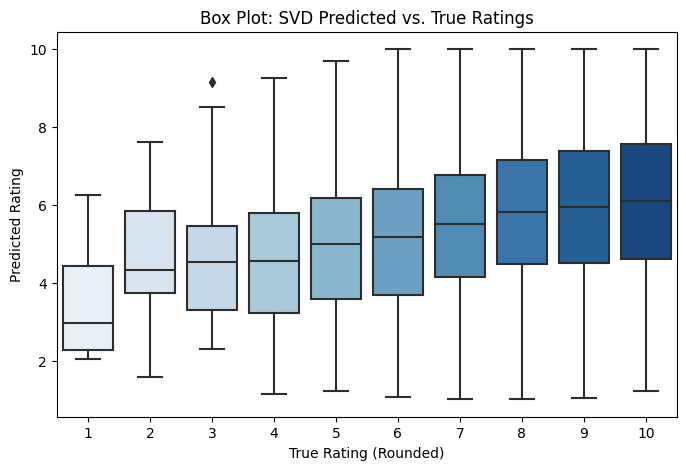

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def plot_box_true_vs_predicted(predictions_df, sample_size=5000):
    # Sample the data if it's very large for faster plotting.
    if len(predictions_df) > sample_size:
        df_sample = predictions_df.sample(n=sample_size, random_state=42)
    else:
        df_sample = predictions_df.copy()

    # Filter ratings to the expected 1-10 range (if needed)
    df_sample = df_sample[(df_sample['TrueRating'] >= 1) & (df_sample['TrueRating'] <= 10)]
    df_sample = df_sample[(df_sample['PredictedRating'] >= 1) & (df_sample['PredictedRating'] <= 10)]

    # Round the true ratings and keep them as integers for proper ordering.
    df_sample['TrueRatingRounded'] = df_sample['TrueRating'].round().astype(int)

    # Get the natural sorted order of true ratings.
    order = sorted(df_sample['TrueRatingRounded'].unique())

    plt.figure(figsize=(8, 5))
    sns.boxplot(data=df_sample, x="TrueRatingRounded", y="PredictedRating", palette="Blues", order=order)
    plt.xlabel("True Rating (Rounded)")
    plt.ylabel("Predicted Rating")
    plt.title("Box Plot: SVD Predicted vs. True Ratings")
    plt.show()

# Example usage:
# Assuming predictions_svd_df is a DataFrame with columns 'TrueRating' and 'PredictedRating'
plot_box_true_vs_predicted(predictions_svd_df)


This box plot shows how the model’s predicted ratings vary for each rounded true rating on the x-axis. Each box spans the 25th to 75th percentile of predictions, with the line inside indicating the median predicted rating. As the true rating increases, the boxes generally shift higher, indicating that the model’s predictions also increase. However, you can see some underprediction at higher ratings where the median predicted values are below the true rating level.


In [ ]:
anime_name = "Death Note"  # 🔄 change this to test different anime
target_row = anime_df[anime_df['title'].str.contains(anime_name, case=False, na=False)]

if not target_row.empty:
    target_anime_id = target_row['anime_id'].iloc[0]
    print(f"Target anime ID for '{anime_name}': {target_anime_id}")

    # Get recommendations from each model
    print("\n🎯 TF-IDF Recommendations:")
    print(cbr.recommend_tfidf(target_anime_id, top_k=10))

    print("\n🧠 BERT Recommendations:")
    print(cbr.recommend_bert(target_anime_id, top_k=10))

    print("\n🔗 Hybrid Recommendations (TF-IDF + BERT):")
    print(cbr.recommend_hybrid(target_anime_id, top_k=10, weight_tfidf=0.5, weight_bert=0.5))
else:
    print(f"❌ Anime '{anime_name}' not found in anime_df.")


Target anime ID for 'Death Note': 1535

🎯 TF-IDF Recommendations:
       anime_id                                    Name                 Genres
2722       2994                     Death Note: Rewrite  Supernatural Suspense
9072      24179                            Strobe Light                UNKNOWN
23544     53717                             Mugen no Hi            Avant Garde
6779      12661                               Light Lag                UNKNOWN
23320     53242                            WONDER LiGHT                UNKNOWN
6677      12133                      Sekaikei Sekai Ron                 Sci-Fi
24809     55612                     Hikari: Be My Light        Boys Love Drama
6400      10882                         Ghost Messenger    Action Supernatural
17094     42698  Nissan Note x The World of Golden Eggs                 Comedy
13041     35531                        Otsukisama Light                UNKNOWN

🧠 BERT Recommendations:
       anime_id                         

For target anime ID 1535 ("Death Note"), the TF‑IDF method (🎯) returns recommendations such as "Death Note: Rewrite", "Strobe Light", and "Light Lag", emphasizing items with strong lexical cues in genres like Supernatural and Suspense. The BERT method (🧠) suggests titles like "Death Note: Rewrite", "Dead Mount Death Play", and "Summertime Render", capturing nuanced semantic relationships in genres ranging from Action and Fantasy to Horror. The hybrid approach (🔗), which combines both TF‑IDF and BERT signals, produces a balanced list including "Death Note: Rewrite", "Soul Eater", "Ghost Messenger", and "Angel Beats!", offering a diverse selection that reflects both surface features and deeper contextual similarities.